In [1]:
import os
import re
import csv
import ray
import random
import datetime
import json

import seaborn as sns
from pathlib import Path
import matplotlib.pyplot as plt

from util import *
from estimator import *
from evaluator import run_grid_search

os.environ.pop('http_proxy', None)

/Users/jonas/Documents/GitHub/Reproducibility-sens-cons/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/jonas/Documents/GitHub/Reproducibility-sens-cons/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-11-15 13:18:31,611	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


### Parse DBPEDIA data (https://arxiv.org/pdf/2102.09690)

In [2]:
input_file = Path('./data/DBPEDIA/test.csv')
results_folder = Path('./data/DBPEDIA_RESULTS')
processed_data_file = Path('./data/DBPEDIA_RESULTS/data.json')
dataset = 'DBPEDIA'
class_labels = ["Company",
                "EducationalInstitution",
                "Artist",
                "Athlete",
                "OfficeHolder",
                "MeanOfTransportation",
                "Building", 
                "NaturalPlace",
                "Village",
                "Animal",
                "Plant",
                "Album", 
                "Film",
                "WrittenWork",
                "N/A"]

class_labels_to_id = {c_name: i for i, c_name in enumerate(class_labels)}

def parse_DBPEDIA(csv_file_path):
    
    data = []
    with open(csv_file_path, 'r', newline='', encoding='utf-8') as csvfile:
        csvreader = csv.DictReader(csvfile)
        for row_id, row in enumerate(csvreader, start=1):
            # Extract values from the CSV row
            class_value = class_labels[int(row['Class'])-1]
            text_value = row['Text']
            
            # Create a dictionary representing the row
            row_dict = {
                'id': row_id,
                'class': class_value,
                'input': text_value
            }
            
            # Append the row dictionary to the list
            data.append(row_dict)
    
    return data


def balance_dataset(class_labels, samples, total_samples):
    # Shuffle the samples
    random.shuffle(samples)
    
    n_samples_per_class = total_samples // len(class_labels)
    balanced_dataset = []
    class_count = {label: 0 for label in class_labels}
    
    remaining_samples = []
    
    for sample in samples:
        label = sample['class']
        if class_count[label] < n_samples_per_class:
            balanced_dataset.append(sample)
            class_count[label] += 1
        else:
            remaining_samples.append(sample)
    
    # If we still need more samples to reach total_samples, randomly sample from remaining samples
    while len(balanced_dataset) < total_samples and remaining_samples:
        random_sample = random.choice(remaining_samples)
        balanced_dataset.append(random_sample)
        remaining_samples.remove(random_sample)
    
    # Now, extract one sample per class from the remaining samples
    one_sample_per_class = []
    for label in class_labels:
        for s in remaining_samples:
            if s['class'] == label:
                one_sample_per_class.append(s)
                break
                
    return balanced_dataset[:total_samples], one_sample_per_class  # Ensure exactly total_samples in the output


n_samples = 2000
random.seed(42)

if not os.path.exists(processed_data_file):
    data_list, one_shot_examples = balance_dataset(class_labels[:-1], parse_DBPEDIA(input_file), n_samples)  # do not count NA
    
    # Serialize the dictionary to a JSON string
    json_data = json.dumps((data_list, one_shot_examples))
    
    # Write the JSON string to a file
    with open(processed_data_file, 'w') as f:
        f.write(json_data)
else:
    with open(processed_data_file, 'r') as f:
        loaded_data = json.load(f)

    if isinstance(loaded_data, list) and len(loaded_data) == 2:
        data_list, one_shot_examples = loaded_data
    elif isinstance(loaded_data, list):
        data_list, one_shot_examples = balance_dataset(class_labels[:-1], loaded_data, n_samples)
        json_data = json.dumps((data_list, one_shot_examples))
        with open(processed_data_file, 'w') as f:
            f.write(json_data)
    else:
        raise ValueError(f"Unexpected data format in {processed_data_file}")

sample_ids = [s["id"] for s in data_list]


def class_extractor_fun(text):
    # we might want to check if more than a word is returned, but does not seem strictly necessary
    for l in class_labels:
        if l.lower() in text.lower():
            return l
    # if no label has been found
    return "N/A"

In [3]:
s_id = 1
print(data_list[s_id]['input'])
print(data_list[s_id]['class'])

for s in one_shot_examples:
    print(s['class'])

 Darkman is a 1990 American superhero action film directed and co-written by Sam Raimi. It is based on a short story Raimi wrote that paid homage to Universal's horror films of the 1930s.
Film
Company
EducationalInstitution
Artist
Athlete
OfficeHolder
MeanOfTransportation
Building
NaturalPlace
Village
Animal
Plant
Album
Film
WrittenWork


## Run a grid search over parameters

In [4]:
question_to_rewrite = "Classify the text based on whether their subject is a Company, Educational Institution, Artist, Athlete, Office Holder, Mean Of Transportation, Building, Natural Place, Village, Animal, Plant, Album,  Film, or Written Work."

prompt_simple = [
    ["system", "You are a text classifier."],
    ["user", "Classify the text based on whether their subject is a Company, Educational Institution, Artist, Athlete, Office Holder, Mean Of Transportation, Building, Natural Place, Village, Animal, Plant, Album,  Film, or Written Work.\nAnswer with the class name only.\nThe possible classes are: Company, Educational Institution, Artist, Athlete, Office Holder, Mean Of Transportation, Building, Natural Place, Village, Animal, Plant, Album,  Film, and Written Work.\nHere is the text: {summary}"]    
]

prompt_instruct = [
    ["system", "You are a text classifier."],
    ["user", "Classify the text based on whether their subject is a Company, Educational Institution, Artist, Athlete, Office Holder, Mean Of Transportation, Building, Natural Place, Village, Animal, Plant, Album,  Film, or Written Work.\nAnswer with the class name only.\nThe possible classes are: \n- Company: An organization engaged in commercial, industrial, or professional activities, aiming to generate profit through the provision of goods or services.\n- Educational Institution: An establishment dedicated to teaching and learning, ranging from primary schools to universities and research institutes.\n- Artist: A creative individual who produces artworks, such as paintings, sculptures, music, or performances, to express ideas and evoke emotions.\n- Athlete: A person who competes in sports or physical activities, often at a professional level, requiring training, skill, and physical prowess.\n- Office Holder: An individual who occupies a formal position of authority or responsibility within an organization, government, or other entity.\n- Mean of Transportation: Any vehicle or system used to move people or goods from one place to another, such as cars, trains, planes, or bicycles.\n- Building: A structure with a roof and walls, such as a house, office, or factory, intended for occupancy or use for various purposes.\n- Natural Place: A location characterized by natural features and landscapes, such as forests, mountains, lakes, or beaches, often untouched by human activity.\n- Village: A small, rural community typically smaller than a town, with a close-knit population and local governance.\n- Animal: A living organism that feeds on organic matter, typically having specialized sense organs and nervous systems and able to respond rapidly to stimuli.\n- Plant: A multicellular organism that typically produces its own food through photosynthesis, forming a fundamental part of Earth's ecosystems.\n- Album: A collection of audio recordings issued as a single item, usually consisting of several tracks by a musician or band.\n- Film: A motion picture or movie, created by recording moving images and sound to tell a story or document reality.\n- Written Work: Any form of text, such as a book, article, or essay, created to communicate information, ideas, or narratives through written language.\nHere is the text: {summary}"]    
]

prompt_fewshot = [
    ["system", "You are a text classifier."],
    ["user", "Classify the text based on whether their subject is a Company, Educational Institution, Artist, Athlete, Office Holder, Mean Of Transportation, Building, Natural Place, Village, Animal, Plant, Album,  Film, or Written Work.\nAnswer with the class name only.\nThe possible classes are: \n- Company: An organization engaged in commercial, industrial, or professional activities, aiming to generate profit through the provision of goods or services.\n- Educational Institution: An establishment dedicated to teaching and learning, ranging from primary schools to universities and research institutes.\n- Artist: A creative individual who produces artworks, such as paintings, sculptures, music, or performances, to express ideas and evoke emotions.\n- Athlete: A person who competes in sports or physical activities, often at a professional level, requiring training, skill, and physical prowess.\n- Office Holder: An individual who occupies a formal position of authority or responsibility within an organization, government, or other entity.\n- Mean of Transportation: Any vehicle or system used to move people or goods from one place to another, such as cars, trains, planes, or bicycles.\n- Building: A structure with a roof and walls, such as a house, office, or factory, intended for occupancy or use for various purposes.\n- Natural Place: A location characterized by natural features and landscapes, such as forests, mountains, lakes, or beaches, often untouched by human activity.\n- Village: A small, rural community typically smaller than a town, with a close-knit population and local governance.\n- Animal: A living organism that feeds on organic matter, typically having specialized sense organs and nervous systems and able to respond rapidly to stimuli.\n- Plant: A multicellular organism that typically produces its own food through photosynthesis, forming a fundamental part of Earth's ecosystems.\n- Album: A collection of audio recordings issued as a single item, usually consisting of several tracks by a musician or band.\n- Film: A motion picture or movie, created by recording moving images and sound to tell a story or document reality.\n- Written Work: Any form of text, such as a book, article, or essay, created to communicate information, ideas, or narratives through written language.\n"]    
]
prompt_fewshot[1][1] = prompt_fewshot[1][1] + "Here are a few examples:\n"
for s in one_shot_examples:
    prompt_fewshot[1][1] = prompt_fewshot[1][1] + f"Class {s['class']}: {s['input']}\n" 
prompt_fewshot[1][1] = prompt_fewshot[1][1] + "\nHere is the text: {summary}"

prompt_types = {"simple": prompt_simple,
                "instruct": prompt_instruct,
                "fewshot": prompt_fewshot,
                }

# print(prompt_fewshot)

llms = ['mixtral']#, 'gpt-3.5', 'gpt-4o']
Qs = [30] # number of equivalent but alternative questions compared to original question
temp_questions = [0.]#list(np.arange(0., 1.25, 0.25))  # temperature of the LLM used to produce questions
As = [1] # number of alternative answers for each questions
temp_answers =  [0.] # list(np.arange(0., 1.5, 0.25))  # temperature of the LLM used to produce answers

samples = data_list
n_samples = len(samples)
print(f'Num test examples is {len(samples)}')

Num test examples is 2000


In [5]:
update_results_files_with_distributions(
    results_folder,
    prompt_types,
    class_labels,
    class_extractor_fun
)


Processing results_simple.json...
No updates needed for results_simple.json (all experiments already have distributions and info_answers)
Processing results_instruct.json...
No updates needed for results_instruct.json (all experiments already have distributions and info_answers)
Processing results_fewshot.json...
No updates needed for results_fewshot.json (all experiments already have distributions and info_answers)


Prompt type: simple


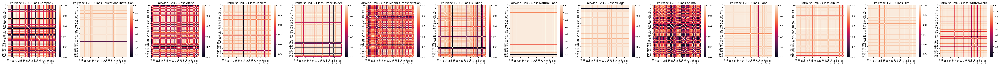

Prompt type: instruct


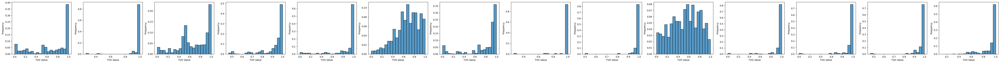

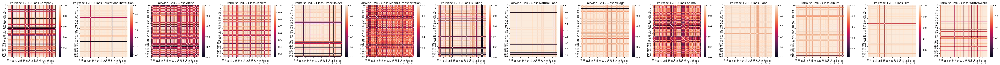

Prompt type: fewshot


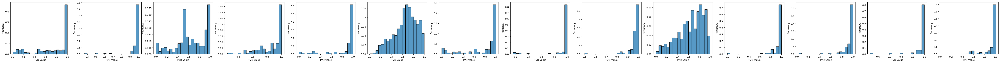

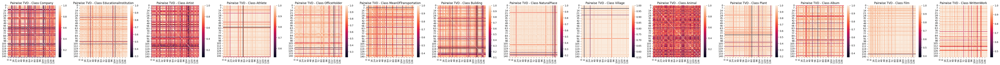

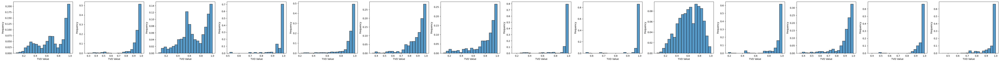

In [8]:
plot_TVD_info(sample_ids,
              prompt_types,
              llms,
              Qs,
              temp_questions,
              As,
              temp_answers,
              class_labels,
              results_folder)

In [28]:
plot_questions_vs_predicted_distribution(sample_ids,
                                        prompt_types,
                                        llms,
                                        Qs,
                                        temp_questions,
                                        As,
                                        temp_answers,
                                        class_labels,
                                        results_folder)

Prompt type: simple


Prompt type: instruct


Prompt type: fewshot


Prompt type: simple


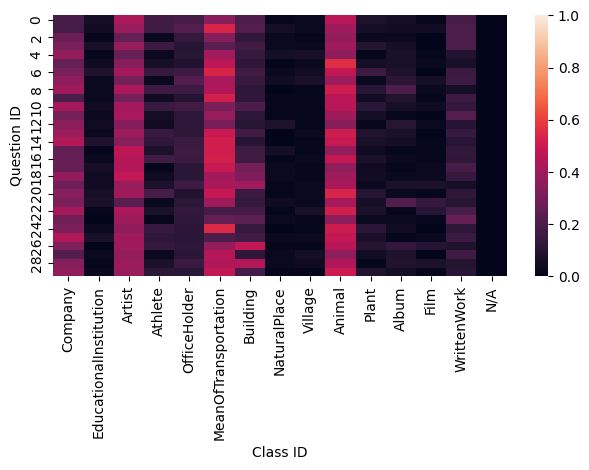

Prompt type: instruct


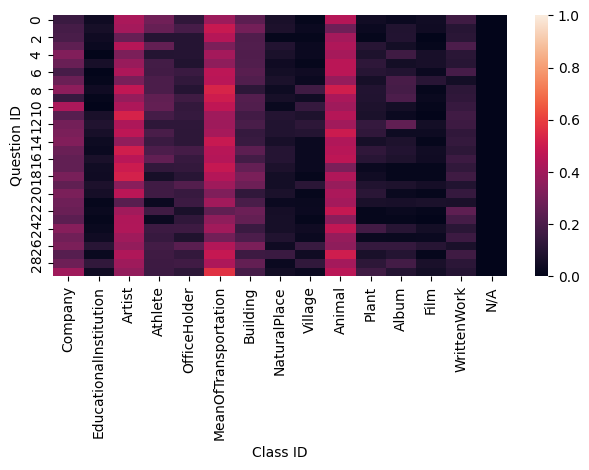

Prompt type: fewshot


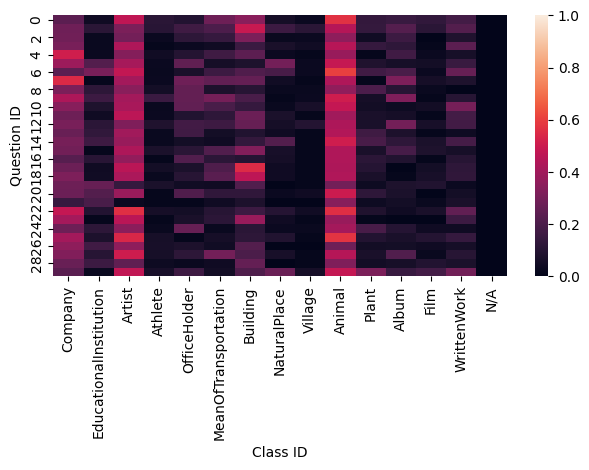

In [29]:
plot_questions_vs_class_sensitivity(sample_ids,
                               prompt_types,
                               llms,
                               Qs,
                               temp_questions,
                               As,
                               temp_answers,
                               class_labels,
                               results_folder)

In [31]:
for llm in ['mixtral']:
    for prompt_type in ['simple', 'instruct', 'fewshot']:
        print(llm, prompt_type)
        Q = 30
        A = 1  # MUST stay 1
        temp_question = 0.
        temp_answer = 0.
        max_value = 1
        
        print_classification_scores(sample_ids,
                                    prompt_type,
                                    llm,
                                    Q,
                                    temp_question,
                                    A,
                                    temp_answer,
                                    class_labels,
                                    results_folder)

mixtral simple
Global scores, accuracy: 0.834, micro f1-score: 0.834, macro f1-score: 0.7696079624053722
Standard deviation of microf1 score: 0.021442533017864807
mixtral instruct
Global scores, accuracy: 0.786, micro f1-score: 0.786, macro f1-score: 0.7145905751076462
Standard deviation of microf1 score: 0.029191137353655826
mixtral fewshot
Global scores, accuracy: 0.637, micro f1-score: 0.637, macro f1-score: 0.6363879786623835
Standard deviation of microf1 score: 0.212986711244309


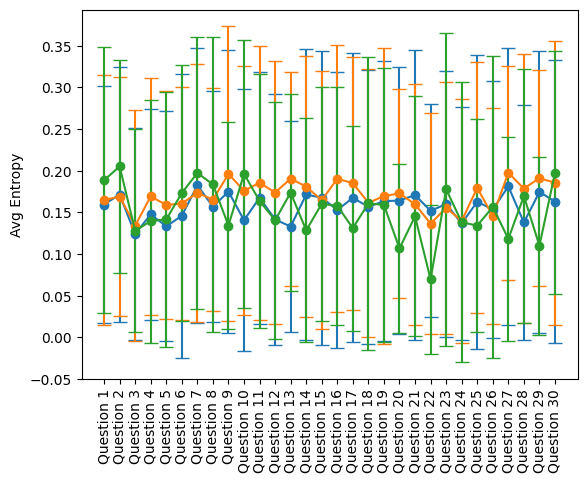

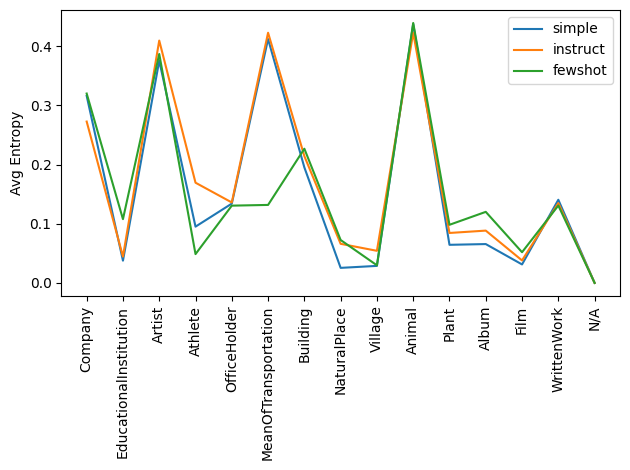

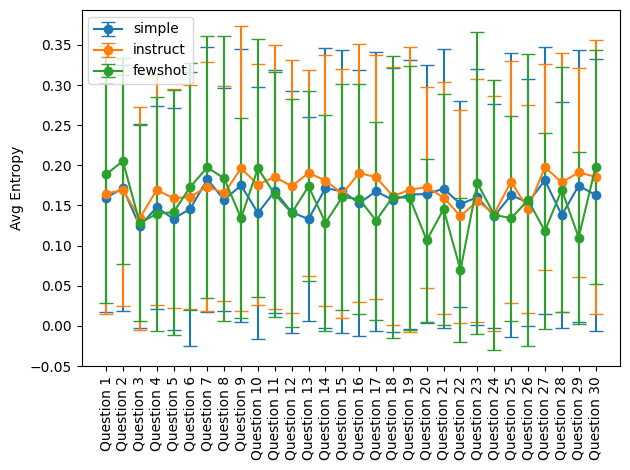

In [32]:
plot_avg_sensitivity(sample_ids,
                 prompt_types,
                 llms,
                 Qs,
                 [0.],
                 As,
                 temp_answers,
                 class_labels,
                 results_folder)

mixtral simple
Avg Entropy over samples: 0.07626287943416606,Std over samples: 0.12773157963827908
mixtral instruct
Avg Entropy over samples: 0.09322059404403721,Std over samples: 0.1402173617626752
mixtral fewshot
Avg Entropy over samples: 0.22231452198674362,Std over samples: 0.11870034470441836


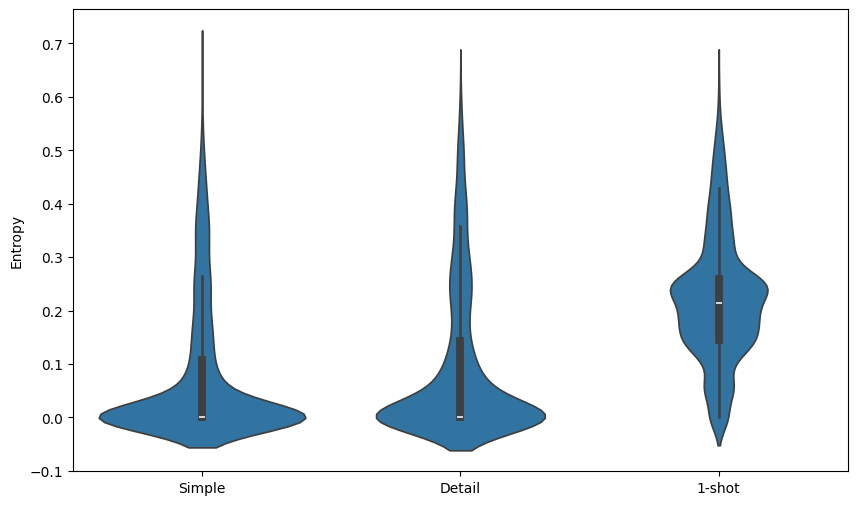

In [33]:
for llm in ['mixtral']:
    Q = 30
    A = 1  # MUST stay 1
    temp_question = 0.
    temp_answer = 0.
    
    data = []
    
    for prompt_type in ['simple', 'instruct', 'fewshot']:
        print(llm, prompt_type)
        em = print_test_sensitivity_over_samples(sample_ids,
                                        prompt_type,
                                        llm,
                                        Q,
                                        temp_question,
                                        A,
                                        temp_answer,
                                        class_labels,
                                        results_folder)
    
        data.append((em, prompt_type))
    
    # Prepare lists to collect expanded data
    expanded_values = []
    expanded_labels = []
    
    # Expand the data into individual points
    for arr, label in data:
        expanded_values.extend(arr)
        expanded_labels.extend([label] * len(arr))
    
    # Create a DataFrame from the expanded data
    df = pd.DataFrame({'Values': expanded_values, 'Label': expanded_labels})
    
    # Plot the violin plot
    plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
    ax =sns.violinplot(x='Label', y='Values', data=df, split=False)
    plt.xlabel(None)
    ax.set_xticks(np.arange(3)) # <--- set the ticks first
    ax.set_xticklabels(['Simple', 'Detail', '1-shot'])
    plt.ylabel('Entropy')
    plt.show()

In [35]:
if not os.path.exists(Path(results_folder, 'paper_figures')):
    os.makedirs(Path(results_folder, 'paper_figures'))
    
# Configure matplotlib to use LaTeX
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
# Set the global font size
plt.rc('font', size=20)  # Example: set the font size to 14

sns.set_style("whitegrid")
sns.color_palette("colorblind")

dataset="DBPedia"

figsize=(7.5,4.5)
n_samples, n_classes = len(samples), len(class_labels)

for llm in ['mixtral']:
    Q = 30
    A = 1  # MUST stay 1
    temp_question = 0.
    temp_answer = 0.
    
    data = []

    for prompt_type in ['simple', 'instruct', 'fewshot']:
        print(llm, prompt_type)
        TVD_matrix_per_class = print_consistency(sample_ids,
                                       prompt_type,
                                       llm,
                                       Q,
                                       temp_question,
                                       A,
                                       temp_answer,
                                       class_labels,
                                       results_folder)
    
        for c, TVD_matrix in enumerate(TVD_matrix_per_class):
            data.append((TVD_matrix.reshape(-1), prompt_type))
            
            c_name = class_labels[c]

            # plt.figure(figsize=(figsize[0]+1, figsize[0]))
            # ax = sns.heatmap(TVD_matrix, cbar_kws={'orientation': 'horizontal'})
            # plt.xlabel("Sample ID",fontsize=26)
            # plt.ylabel("Sample ID",fontsize=26)
            # # Adjust the layout to make room for the colorbar
            # plt.tight_layout()
            # plt.savefig(Path(results_folder, 'paper_figures', f'TVD_matrix_{dataset}_{prompt_type}_{llm}_{Q}_{A}_{temp_question}_{temp_answer}_{c_name}.pdf'))
            # #plt.show()

            # sns.histplot(np.reshape(TVD_matrix, -1),
            #                         bins=20, stat='probability', kde=False, color='#3274A1', alpha=1.)
            # plt.xlabel(r"$C_y(x,x')$")
            # plt.tight_layout()
            # plt.savefig(Path(results_folder, 'paper_figures', f'TVD_hist_{dataset}_{prompt_type}_{llm}_{Q}_{A}_{temp_question}_{temp_answer}_{c_name}.pdf'))
            # #plt.show()
    
    
    # Prepare lists to collect expanded data
    expanded_values = []
    expanded_labels = []
    
    # Expand the data into individual points
    for arr, label in data:
        expanded_values.extend(arr)
        expanded_labels.extend([label] * len(arr))
    
    # Create a DataFrame from the expanded data
    df = pd.DataFrame({'Values': expanded_values, 'Label': expanded_labels})
    
    # Plot the violin plot
    # plt.figure(figsize=figsize)  # Adjust the figure size if needed
    # ax = sns.violinplot(x='Label', y='Values', data=df, split=False)
    # plt.xlabel(None)
    # ax.set_xticks(np.arange(3)) # <--- set the ticks first
    # ax.set_xticklabels(['Simple', 'Detail', '1-shot'])
    # plt.ylim(0, 1)
    # plt.ylabel('Consistency')
    # plt.tight_layout()
    # plt.savefig(Path(results_folder, 'paper_figures',
    #         f'consistency_vs_prompting_{dataset}_{llm}_{Q}_{A}_{temp_question}_{temp_answer}.pdf'))
    # plt.show()

mixtral simple
Prompt type: simple
Avg consistency: 0.8023255705429289,Std consistency: 0.30140913099912414
mixtral instruct
Prompt type: instruct
Avg consistency: 0.791108606734285,Std consistency: 0.3013021109675554
mixtral fewshot
Prompt type: fewshot
Avg consistency: 0.8217614791067307,Std consistency: 0.2367231974656564


mixtral simple
Avg Entropy over samples: 0.07626287943416606,Std over samples: 0.12773157963827908


/var/folders/jt/xr8rl11x57b589mn71s3hrcm0000gp/T/ipykernel_1560/2380718316.py:71: RuntimeWarning: Mean of empty slice.
  sens_per_class_mean = np.array([np.array(sens_per_class[c]).mean() for c in range(len(class_labels))])
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/Users/jonas/Documents/Seminars/original_git/sensitivity-co

mixtral instruct
Avg Entropy over samples: 0.09322059404403721,Std over samples: 0.1402173617626752


/var/folders/jt/xr8rl11x57b589mn71s3hrcm0000gp/T/ipykernel_1560/2380718316.py:71: RuntimeWarning: Mean of empty slice.
  sens_per_class_mean = np.array([np.array(sens_per_class[c]).mean() for c in range(len(class_labels))])
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/Users/jonas/Documents/Seminars/original_git/sensitivity-co

mixtral fewshot
Avg Entropy over samples: 0.22231452198674362,Std over samples: 0.11870034470441836


/var/folders/jt/xr8rl11x57b589mn71s3hrcm0000gp/T/ipykernel_1560/2380718316.py:71: RuntimeWarning: Mean of empty slice.
  sens_per_class_mean = np.array([np.array(sens_per_class[c]).mean() for c in range(len(class_labels))])
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jonas/Documents/Seminars/original_git/sensitivity-consistency-LLM/.venv/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/Users/jonas/Documents/Seminars/original_git/sensitivity-co

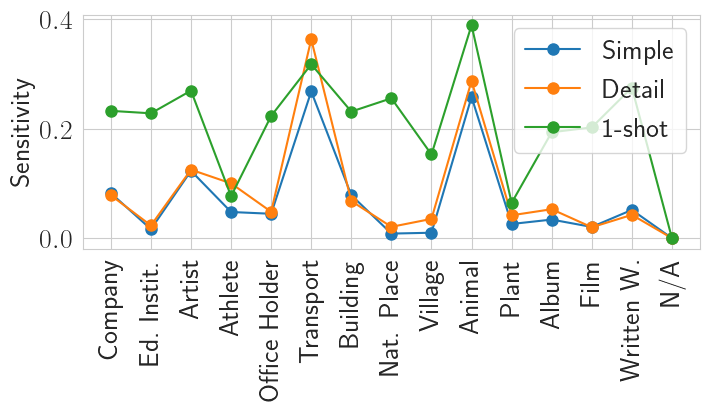

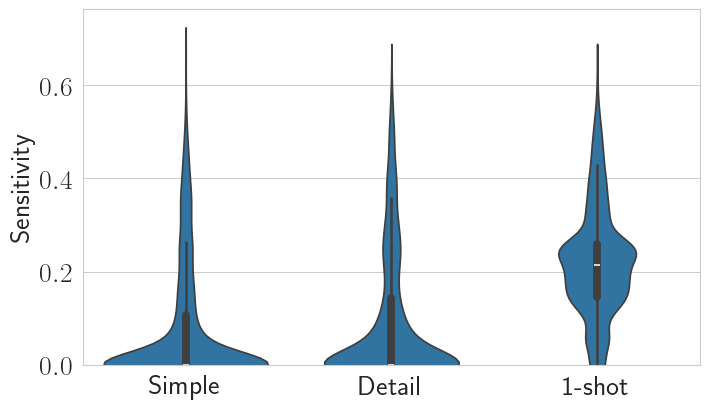

In [36]:
# Configure matplotlib to use LaTeX
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
# Set the global font size
plt.rc('font', size=20)  # Example: set the font size to 14
dataset = 'DBPedia'
sns.set_style("whitegrid")
sns.color_palette("colorblind")

figsize=(7.5,4.5)

for llm in ['mixtral']:
    Q = 30
    A = 1  # MUST stay 1
    temp_question = 0.
    temp_answer = 0.
    
    data = []

    errorbar_fig = plt.figure(figsize=figsize)

    
    for prompt_type in ['simple', 'instruct', 'fewshot']:
        print(llm, prompt_type)
        em = print_test_sensitivity_over_samples(sample_ids,
                                        prompt_type,
                                        llm,
                                        Q,
                                        temp_question,
                                        A,
                                        temp_answer,
                                        class_labels,
                                        results_folder)

        sens_per_class = sensitivity_per_class(sample_ids,
                                               prompt_type,
                                               llm,
                                               Q,
                                               temp_question,
                                               A,
                                               temp_answer,
                                               class_labels,
                                               results_folder)

        # Add error bars (standard deviation)
        plt.figure(errorbar_fig)
        if prompt_type == 'instruct':
            label = 'Detail'
        elif prompt_type == 'fewshot':
            label = '1-shot'
        else:
            label = 'Simple'


        abbr_class_labels = ["Company",
                        "Ed.\ Instit.",
                        "Artist",
                        "Athlete",
                        "Office Holder",
                        "Transport",
                        "Building", 
                        "Nat. Place",
                        "Village",
                        "Animal",
                        "Plant",
                        "Album", 
                        "Film",
                        "Written W.",
                        "N/A"]
        
        sens_per_class_mean = np.array([np.array(sens_per_class[c]).mean() for c in range(len(class_labels))])
        sens_per_class_mean = np.nan_to_num(sens_per_class_mean)
        sens_per_class_std = np.array([np.array(sens_per_class[c]).std() for c in range(len(class_labels))])
        sens_per_class_std = np.nan_to_num(sens_per_class_std)
        # plt.errorbar(np.arange(len(class_labels)), sens_per_class_mean, yerr=sens_per_class_std, fmt='-o',  solid_capstyle='projecting', capsize=5, label=label)
        plt.plot(sens_per_class_mean, label=label, marker='o', markersize=8)
        plt.ylabel('Sensitivity')
        plt.xticks(np.arange(len(abbr_class_labels)),
                            abbr_class_labels,
                            rotation='vertical')      
        plt.legend()
        
        data.append((em, prompt_type))

        plt.figure(errorbar_fig)
    plt.tight_layout()
    plt.savefig(Path(results_folder, 'paper_figures',
                f'sensitivity_vs_class_{dataset}_{llm}_{Q}_{A}_{temp_question}_{temp_answer}.pdf'))
    
    
    # Prepare lists to collect expanded data
    expanded_values = []
    expanded_labels = []
    
    # Expand the data into individual points
    for arr, label in data:
        expanded_values.extend(arr)
        expanded_labels.extend([label] * len(arr))
    
    # Create a DataFrame from the expanded data
    df = pd.DataFrame({'Values': expanded_values, 'Label': expanded_labels})
    
    # Plot the violin plot
    plt.figure(figsize=figsize)  # Adjust the figure size if needed
    ax = sns.violinplot(x='Label', y='Values', data=df, split=False)
    ax.set_xticklabels(['Simple', 'Detail', '1-shot'])
    plt.xlabel(None)
    plt.ylabel('Sensitivity')
    # Setting the y-axis limits to cut off values below 0
    plt.ylim(0, None)
    plt.tight_layout()
    plt.savefig(Path(results_folder, 'paper_figures',
                f'sensitivity_vs_prompting_{dataset}_{llm}_{Q}_{A}_{temp_question}_{temp_answer}.pdf'))
    plt.show()

mixtral simple
Avg Entropy over samples: 0.07626287943416606,Std over samples: 0.12773157963827908
mixtral instruct
Avg Entropy over samples: 0.09322059404403721,Std over samples: 0.1402173617626752
mixtral fewshot
Avg Entropy over samples: 0.22231452198674362,Std over samples: 0.11870034470441836
   Sensitivity Strategy      LLM  Temperature
0     0.076263   Simple  mixtral            0
1     0.093221   Detail  mixtral            0
2     0.222315   1-shot  mixtral            0


<Figure size 750x450 with 0 Axes>

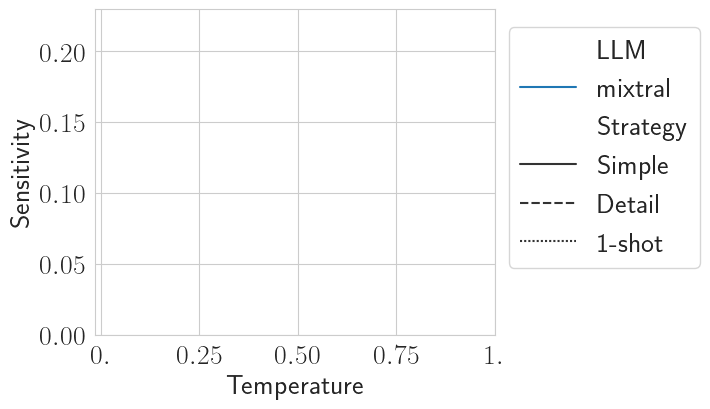

In [37]:
# Configure matplotlib to use LaTeX
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
# Set the global font size
plt.rc('font', size=20)  # Example: set the font size to 14

sns.set_style("whitegrid")
sns.color_palette("colorblind")

figsize=(7.5,4.5)

Q = 30
A = 1  # MUST stay 1
temp_answer = 0.


data = []
errorbar_fig = plt.figure(figsize=figsize)
    
for temp_question in temp_questions:
    
    for llm in ['mixtral']:
        
        for prompt_type in ['simple', 'instruct', 'fewshot']:
            print(llm, prompt_type)
            em = print_test_sensitivity_over_samples(sample_ids,
                                            prompt_type,
                                            llm,
                                            Q,
                                            temp_question,
                                            A,
                                            temp_answer,
                                            class_labels,
                                            results_folder)
    
    
            # Add error bars (standard deviation)
            plt.figure(errorbar_fig)
            if prompt_type == 'instruct':
                label = 'Detail'
            elif prompt_type == 'fewshot':
                label = '1-shot'
            else:
                label = 'Simple'
    
            
            data.append((em.mean(), label, llm, int(temp_question/0.25)))
            
        
        
# Create a DataFrame from the expanded data
df = pd.DataFrame(data, columns=['Sensitivity', 'Strategy', 'LLM', 'Temperature'])
print(df)
# Plot the violin plot
plt.figure(figsize=figsize)  # Adjust the figure size if needed
ax = sns.lineplot(x='Temperature', y='Sensitivity', hue='LLM', style='Strategy', data=df)
ax.set_xticks(np.arange(5)) # <--- set the ticks first
ax.set_xticklabels([r'$0.$', r'$0.25$', r'$0.50$', r'$0.75$', r'$1.$'])
# Setting the y-axis limits to cut off values below 0
plt.ylim(0, None)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.575))
plt.tight_layout()
plt.savefig(Path(results_folder, 'paper_figures',
            f'sensitivity_vs_temperature_{dataset}_{Q}_{A}_{temp_answer}.pdf'))
plt.show()